In [380]:
#Import Pandas
import pandas as pd

#Import Dataset
df = pd.read_csv('IOT-temp.csv')

In [381]:
#Data Cleaning
#Interpolate missing values

df_interpolated = df.interpolate()
print(df_interpolated)

                                        id  room_id/id        noted_date  \
0      __export__.temp_log_196134_bd201015  Room Admin  08-12-2018 09:30   
1      __export__.temp_log_196131_7bca51bc  Room Admin  08-12-2018 09:30   
2      __export__.temp_log_196127_522915e3  Room Admin  08-12-2018 09:29   
3      __export__.temp_log_196128_be0919cf  Room Admin  08-12-2018 09:29   
4      __export__.temp_log_196126_d30b72fb  Room Admin  08-12-2018 09:29   
...                                    ...         ...               ...   
97601   __export__.temp_log_91076_7fbd08ca  Room Admin  28-07-2018 07:07   
97602  __export__.temp_log_147733_62c03f31  Room Admin  28-07-2018 07:07   
97603  __export__.temp_log_100386_84093a68  Room Admin  28-07-2018 07:06   
97604  __export__.temp_log_123297_4d8e690b  Room Admin  28-07-2018 07:06   
97605  __export__.temp_log_133741_32958703  Room Admin  28-07-2018 07:06   

       temp out/in  
0        29     In  
1        29     In  
2        41    Out  
3  

C:\Users\ryanb\AppData\Local\Temp\ipykernel_25260\2129830970.py:4: FutureWarning:

DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.



In [382]:
#Remove Duplicates
df_duplicates = pd.DataFrame(df)

df_no_duplicates = df_duplicates.drop_duplicates()
print(df_no_duplicates)


                                        id  room_id/id        noted_date  \
0      __export__.temp_log_196134_bd201015  Room Admin  08-12-2018 09:30   
1      __export__.temp_log_196131_7bca51bc  Room Admin  08-12-2018 09:30   
2      __export__.temp_log_196127_522915e3  Room Admin  08-12-2018 09:29   
3      __export__.temp_log_196128_be0919cf  Room Admin  08-12-2018 09:29   
4      __export__.temp_log_196126_d30b72fb  Room Admin  08-12-2018 09:29   
...                                    ...         ...               ...   
97601   __export__.temp_log_91076_7fbd08ca  Room Admin  28-07-2018 07:07   
97602  __export__.temp_log_147733_62c03f31  Room Admin  28-07-2018 07:07   
97603  __export__.temp_log_100386_84093a68  Room Admin  28-07-2018 07:06   
97604  __export__.temp_log_123297_4d8e690b  Room Admin  28-07-2018 07:06   
97605  __export__.temp_log_133741_32958703  Room Admin  28-07-2018 07:06   

       temp out/in  
0        29     In  
1        29     In  
2        41    Out  
3  

In [383]:
#Import stats from scipy, calculate z-scores, and remove outliers

from scipy import stats

z_scores = stats.zscore(data['temp'])

df_no_outliers = df[(z_scores < 3) & (z_scores > -3)]

print(df_no_outliers)


                                        id  room_id/id        noted_date  \
0      __export__.temp_log_196134_bd201015  Room Admin  08-12-2018 09:30   
1      __export__.temp_log_196131_7bca51bc  Room Admin  08-12-2018 09:30   
2      __export__.temp_log_196127_522915e3  Room Admin  08-12-2018 09:29   
3      __export__.temp_log_196128_be0919cf  Room Admin  08-12-2018 09:29   
4      __export__.temp_log_196126_d30b72fb  Room Admin  08-12-2018 09:29   
...                                    ...         ...               ...   
97601   __export__.temp_log_91076_7fbd08ca  Room Admin  28-07-2018 07:07   
97602  __export__.temp_log_147733_62c03f31  Room Admin  28-07-2018 07:07   
97603  __export__.temp_log_100386_84093a68  Room Admin  28-07-2018 07:06   
97604  __export__.temp_log_123297_4d8e690b  Room Admin  28-07-2018 07:06   
97605  __export__.temp_log_133741_32958703  Room Admin  28-07-2018 07:06   

       temp out/in  
0        29     In  
1        29     In  
2        41    Out  
3  

In [384]:
#Data Transformation
#Convert timestamp column to datetime format

df['noted_date'] = pd.to_datetime(df['noted_date'], errors='coerce')
print(df.head())

                                    id  room_id/id          noted_date  temp  \
0  __export__.temp_log_196134_bd201015  Room Admin 2018-08-12 09:30:00    29   
1  __export__.temp_log_196131_7bca51bc  Room Admin 2018-08-12 09:30:00    29   
2  __export__.temp_log_196127_522915e3  Room Admin 2018-08-12 09:29:00    41   
3  __export__.temp_log_196128_be0919cf  Room Admin 2018-08-12 09:29:00    41   
4  __export__.temp_log_196126_d30b72fb  Room Admin 2018-08-12 09:29:00    31   

  out/in  
0     In  
1     In  
2    Out  
3    Out  
4     In  


In [385]:
#extract additional features such as year and month from the timestamp

df['year'] = pd.DatetimeIndex(df['noted_date']).year
df['month'] = pd.DatetimeIndex(df['noted_date']).month
print(df.head())

                                    id  room_id/id          noted_date  temp  \
0  __export__.temp_log_196134_bd201015  Room Admin 2018-08-12 09:30:00    29   
1  __export__.temp_log_196131_7bca51bc  Room Admin 2018-08-12 09:30:00    29   
2  __export__.temp_log_196127_522915e3  Room Admin 2018-08-12 09:29:00    41   
3  __export__.temp_log_196128_be0919cf  Room Admin 2018-08-12 09:29:00    41   
4  __export__.temp_log_196126_d30b72fb  Room Admin 2018-08-12 09:29:00    31   

  out/in    year  month  
0     In  2018.0    8.0  
1     In  2018.0    8.0  
2    Out  2018.0    8.0  
3    Out  2018.0    8.0  
4     In  2018.0    8.0  


In [386]:
#Aggregate data to analyze most popular temperature

popular_temp = df['temp'].value_counts().reset_index()
popular_temp.columns = ['temp', 'Count']

print(popular_temp.head())

   temp  Count
0    39  10203
1    28   8831
2    29   7922
3    40   7798
4    31   7236


In [387]:
#Aggregate data to analyze most used measurement area

popular_out_in = df['out/in'].value_counts().reset_index()
popular_temp.columns = ['out/in', 'Count']

print(popular_out_in.head())

  out/in  count
0    Out  77261
1     In  20345


In [388]:
#Exploratory Data Analysis

import numpy as np
#Summary Statistics
# Mean, Median, Mode
mean = np.mean(df['temp'])
median = np.median(df['temp'])
mode = stats.mode(df['temp'])

# Variance, Standard Deviation
variance = np.var(df['temp'])
std_deviation = np.std(df['temp'])

# Quartiles and Interquartile Range (IQR)
quartiles = np.percentile(df['temp'], [25, 50, 75])
iqr = quartiles[2] - quartiles[0]

# Skewness and Kurtosis
skewness = stats.skew(df['temp'])
kurtosis = stats.kurtosis(df['temp'])

print("Mean:", mean)
print("Median:", median)
print("Mode:", mode)
print("Variance:", variance)
print("Standard Deviation:", std_deviation)
print("25th Percentile (Q1):", quartiles[0])
print("50th Percentile (Q2/Median):", quartiles[1])
print("75th Percentile (Q3):", quartiles[2])
print("Interquartile Range (IQR):", iqr)
print("Skewness:", skewness)
print("Kurtosis:", kurtosis)

Mean: 35.05393111079237
Median: 35.0
Mode: ModeResult(mode=np.int64(39), count=np.int64(10203))
Variance: 32.487676030498015
Standard Deviation: 5.699796139380602
25th Percentile (Q1): 30.0
50th Percentile (Q2/Median): 35.0
75th Percentile (Q3): 40.0
Interquartile Range (IQR): 10.0
Skewness: 0.2541995757228252
Kurtosis: -0.9963143691756162


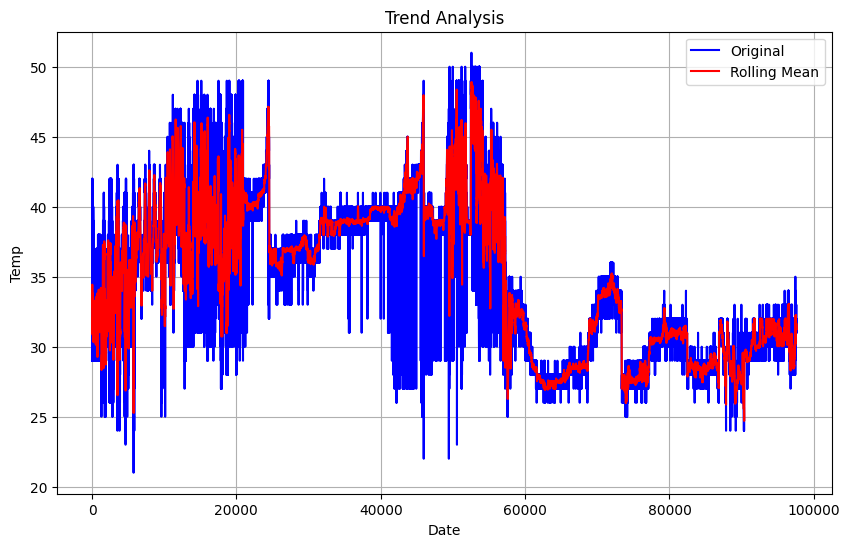

In [389]:
# Calculate rolling mean for trend analysis
rolling_mean = df['temp'].rolling(window=30).mean()

# Plot original data and rolling mean
plt.figure(figsize=(10, 6))
df['temp'].plot(color='blue', label='Original')
rolling_mean.plot(color='red', label='Rolling Mean')
plt.title('Trend Analysis')
plt.xlabel('Date')
plt.ylabel('Temp')
plt.legend()
plt.grid(True)
plt.show()

In [390]:
#Analyze patterns over different time periods

# Calculate rolling mean over a window of 7 days
rolling_mean = df['temp'].rolling(window=7).mean()

# Calculate rolling standard deviation over a window of 30 days
rolling_std = df['temp'].rolling(window=30).std()

In [391]:
# Calculate rolling standard deviation over a window of 30 days
rolling_std = df['temp'].rolling(window=30).std()

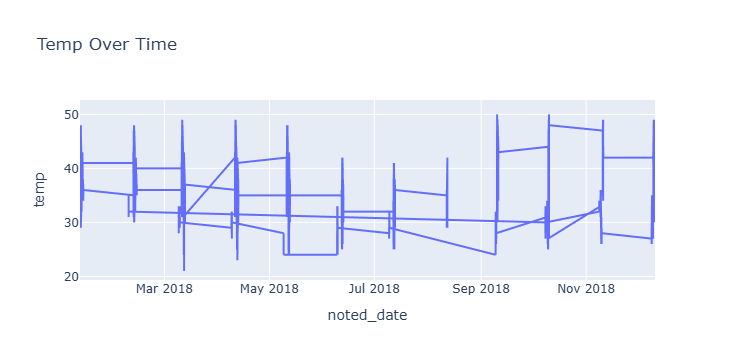

In [392]:
import plotly.express as px

# Line Plot to show temperature over time
fig1 = px.line(df, x='noted_date', y='temp', title='Temp Over Time')
fig1.show()


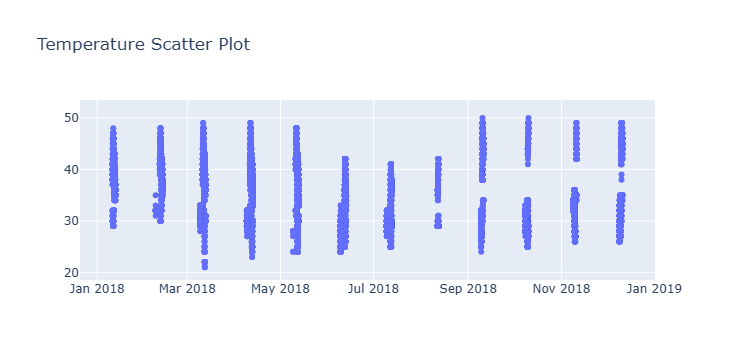

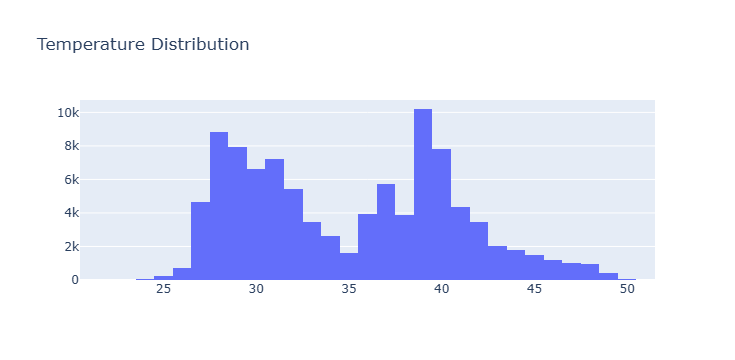

In [393]:
import plotly.graph_objects as go

# Scatter Plot for temperature
fig3 = go.Figure()
fig3.add_trace(go.Scatter(x=df['noted_date'], y=df['temp'], mode='markers', name='Temperature'))
fig3.update_layout(title='Temperature Scatter Plot')
fig3.show()

# Histogram of temperature distribution
fig4 = go.Figure()
fig4.add_trace(go.Histogram(x=df['temp'], name='Temperature'))
fig4.update_layout(title='Temperature Distribution')
fig4.show()

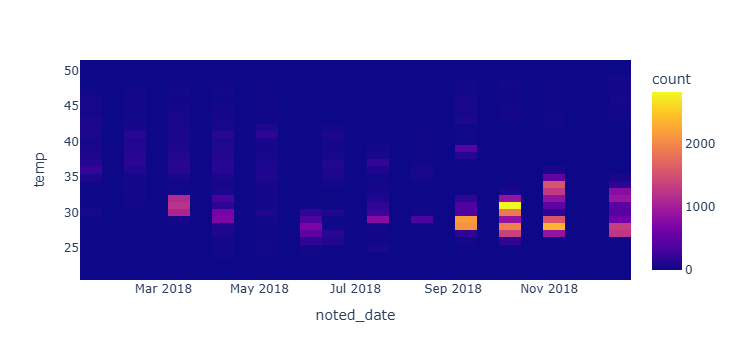

In [394]:
#create a heatmap for temperature
import plotly.express as px

fig = px.density_heatmap(df, x="noted_date", y="temp")
fig.show()
